ANONYMIZED

## Sparse Linear Probing of A Goal Misgeneralizing Agent

The paper [Goal Misgeneralization in Deep Reinforcement Learning](https://arxiv.org/abs/2105.14111) by Langosco et al. demonstrated that by varying the training and test environment distributions, it is possible to produce RL agents that maintain capabilities in off-training-distrution environments, but use these capabilities towards a goal that is different from the goal that the RL reward was intended to incentivize.  This goal misgeneralization is important for alignment. The work described here is part of a broader effort to interpret these goal misgeneralizing agents, which started as part of ANONYMIZED

The broad research questions this work is intended to help answer are:
- How does this agent actually work?? More examples of successful reverse-engineering efforts on mid-sized networks that can solve non-trivial problems seems useful even outside of the goal misgeneralization aspect.  What abstractions does it use internally?  Are they Natural?  Do they seem highly specific to this environment and task, or can we find evidence of more general or universal algorithms?
- More specifically, how are goal implemented at a circuits level in this model?  How decoupled (if at all) are goals and capabilities in this agent?
- This agent appears behaviorally to have two competing subgoals (or subshards): a cheese goal/shard, and a top-right-corner goal/shard.  Are these two goals decouplable at the circuit level?  If so, how are they integrated / decided between?

The focus of this document is the use of linear probing as a tool to get some insights into these questions.

### Summary of Results So Far

Probing for abstractions
- Sparse linear probes can be applied to this network, and can predict quantities assocaited with simple abstractions with high accuracy, including square open/closed state, cheese location, and mouse location.
- Probe accuracies across layers provide some evidence that more complex representations are encoded in later layers.
- A new probing technique is introduced called "convolutional probing", which results in much higher accuracy when predicting spatially-located targets (e.g. object position) vs standard linear probing.

Probing for reward predictors
- Probing directly for "mouse did find cheese in rollout" is surprisingly accurate: able to achieve 78-85% accuracy depending on the layer, on a baseline "did find cheese" probability of 68%.  This is surprising because the convolutional nature of this network makes it structurally unlikely that a "go to cheese vs top-right" neuron/feature will exist (though still conceivable).
- The information used by "mouse did find cheese" probes varies by layer: in the first IMPALA block, the probes are clearly learning a simple heuristic that mazes larger than 19x19 are much less likely to result in cheese finding. By contrast, in the third IMPALA block (and the FC layer), probes are learning something quite different, and also getting higher accuracy.  I haven't tried to figure out what they are detecting here yet but I think it could be interesting.

Probing for actions
- A linear probe trained to predict next action based on some target behavior can be interpreted as a supervised-learned policy head.  By training such probes (full and sparse), we can learn some interesting things.
- The final size-256 fully-connected "feature" layer seems basically irrelevant in this agent: it's possible to train a linear map from the flattened convnet outputs directly to action logits and achieve almost identical behavior.
- It's possible to correct a large fraction of "errors" in the original network (i.e. states in which the next cheese action is *not* the most probable action) by supervised-retraining a simple linear policy head from the convnet outputs.  This translates to a measurable improvement in cheese-seeking during actual rollouts when using this probe as a new policy head.  (TODO: put actual numbers here)
    - This suggests that the convnet is extracting at least some additional information that is useful for cheese-seeking that the original policy head is simply ignoring due to lack of training pressure to use it.
    - Conversely, there remains a meaningful fraction (~10%, but depends on properties of data distribution of course) of states in which this retrained policy head cannot reliably predict the next cheese action.  This suggests that a significant portion of the "goal-related computations" (if that is even a meaningful concept) take place in the convnet layers.
- It's possible to get near-optimal action-prediction accuracy using only a small fraction of the channels in the final convnet layer (decent with 5/128, solid with 10/128, near-optimal with 20/128), suggesting that the convnet exhibits significant redundancy, and suggesting that interpreting a small subset of the network may be sufficient to understand the key mechanisms/circuits.  Specifically, a new sparse policy head can achieve higher next-cheese-action prediction accuracy than the original agent with only **0.06%** of the parameters in the original network's non-convnet layers!

### Intro to Sparse Linear Probing

Probing is an interpretability technique whereby small models are trained in a supervised manner to predict some target variable from activations taken from inside the model being interpreted, over some dataset. The intent is to demonstrate that a given layer's activations contain a representation of some abstraction or concept by showing that a probe can be trained on these activations to recover a quantity associated with this representation with high accuracy.  Probing has been used extensively on language models to look for evidence that e.g. parts-of-speech, numbers, and other linguistic abstractions are learned and used.

Linear probing limits the structure of the learned probe model to a linear model.  The main benefits of linear probing vs allowing more complex probes are simplicity, speed of training, and resistance to overfitting.  This latter benefit is significant, as there exists evidence that more complex probes (e.g. MLPs) are sometimes able to simply "learn the task" themselves, resulting in misleading false-positives regarding the presence of a given representation in the actual model being studied.  The obvious drawback to linear probes is that they are unable to detect abstractions that are nonlinearly embedded.

Sparse probing is an extension of the technique that attempts to train probes on small subsets of the activation in a given layer; when training is successful, it provides evidence not only that a layer represents a certain target, but that this target can be reconstructed using only a small number of neurons.  This alone does not demonstrate that the representation is highly localized, as it may be possible to train accurate probes for a certain target on many subsets of activations; however, sparse probes can show that small numbers of activations are *sufficient*, which is often highly useful in directing further interpretation efforts.

TODO: add links and references to this section

Let's apply sparse linear probing to the maze agent from the goal misgeneralization paper and see if we can learn anything useful.  First, imports and all that...

In [31]:
# Imports
%reload_ext autoreload
%autoreload 2

import os
import pickle

import numpy as np
import pandas as pd
import scipy as sp
from sklearn.feature_selection import f_classif
import torch as t
import torch.nn.functional as f
import xarray as xr
import plotly.express as px
import plotly as py
import plotly.subplots
import plotly.graph_objects as go
from einops import rearrange, repeat
from IPython.display import Video, display
from tqdm.auto import tqdm
import warnings

# NOTE: this is ANONYMIZED's RL hooking code (and other stuff will be added in the future)
# Install normally with: pip install ANONYMIZED
import ANONYMIZED as cmh
import ANONYMIZED as cro
import ANONYMIZED as cpr

import ANONYMIZED.models as models
import ANONYMIZED.maze as maze

warnings.filterwarnings("ignore", message=r'.*labels with no predicted samples.*')

# Hack to make sure cwd is the script folder
os.chdir(globals()['_dh'][0])

Now load the dataset we'll be working with, load and hook the model, run the batch of observations through a forward pass of the model...

In [3]:
# Load data and set up network
# Only input, resadd outputs, final conv layer flatten out, and FC + logits
values_to_store = [
    'embedder.block1.conv_in0',
    'embedder.block1.res1.resadd_out',
    'embedder.block1.res2.resadd_out',
    'embedder.block2.res1.resadd_out',
    'embedder.block2.res2.resadd_out',
    'embedder.block3.res1.resadd_out',
    'embedder.block3.res2.resadd_out',
    'embedder.flatten_out',
    'embedder.relufc_out',
    'fc_policy_out',
]

# Most studied
# values_to_store = [
#     'embedder.block2.res1.resadd_out'
# ]

# This limits the number of mazes to look for faster exploration
num_batch = 1000

# 10k run, only mazes with dec square, obs saved on dec square
dr = '../episode_data/20230131T224127/'
fn = 'postproc_probe_data.pkl'
state_bytes_key = 'dec_state_bytes'

# Load data from post-processed pickled file
with open(os.path.join(dr, fn), 'rb') as fl:
    data_all = pickle.load(fl)['data']
    num_batch_to_use = min(num_batch, len(data_all))
    data_all = data_all[:num_batch_to_use]

# Pull out the observations into a single batch
batch_coords = np.arange(len(data_all))
obs_all = xr.concat([dd['obs'] for dd in data_all], 
    dim='batch').assign_coords(dict(batch=batch_coords))

# Pull out level seeds for later reference
level_seeds = np.array([maze.EnvState(dd[state_bytes_key]).state_vals['current_level_seed'].val for
    dd in data_all])

# Pull out the maze dim for later reference
maze_dims = np.array([maze.EnvState(dd[state_bytes_key]).state_vals['maze_dim'].val for
    dd in data_all])

# Set up model and hook it
model_file = '../trained_models/maze_I/model_rand_region_5.pth'
policy = models.load_policy(model_file, action_size=15, device=t.device('cpu'))
model_name = os.path.basename(model_file)
hook = cmh.ModuleHook(policy)

# Run obs through model to get all the activations
_ = hook.run_with_input(obs_all, values_to_store=values_to_store)

### Feature Selection

To train a sparse probe, a feature selection algorithm is required.  Many exist, with various optimality guarantees (TODO: include links).  So far we have exclusively used the "f-test" metric, due to it's speed, simplicity and suitability for feature selection for linear models (TODO: link).

### Simple Example: Probing for Open/Closed Maze Square

Possibly the simplest abstraction that we could probe for is the open/closed status of a single specific maze square.  In this case, we choose the square at absolute position (12, 13), since this is guaranteed to exist in mazes of every legal size, and is a "wall" square which will be open/closed with ~50% probability given the operation of the procgen maze generation algorithm (TODO: is this described somewhere?)

Here we will demonstrate the feature selection approach, and then show the performance of sparse probes of various K-values (i.e. number of activations included in probe) over various layers throughout the network.

First, generate the probe target as a bool variable "is open" for the chosen square...

In [4]:
square_to_probe = (12, 13)
square_is_open = []
for dd in tqdm(data_all):
    square_is_open.append(maze.EnvState(dd[state_bytes_key]).full_grid()[square_to_probe] != maze.BLOCKED)
square_is_open = np.array(square_is_open, dtype=bool)

  0%|          | 0/1000 [00:00<?, ?it/s]

Then, demonstrate the f-test as a feature selection metric by showing an example (grayscaled) maze observation with the f-score for each pixel of the observation over the full dataset overlaid in red.  We'd expect to see a blob of red over the (12, 13) square...


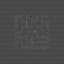

In [5]:
f_scores, p_values = f_classif(rearrange(obs_all.values, 'b c h w -> b (c h w)'), square_is_open)
def norm01(x):
    return (x-np.min(x))/(np.max(x)-np.min(x))
f_scores_max_over_clrs = norm01(rearrange(f_scores, '(c h w) -> h w c', c=3, w=obs_all.shape[2]).max(axis=-1))
obs_with_f_score = repeat(obs_all[0].values.mean(axis=0), 'h w -> h w c', c=3)*0.5
obs_with_f_score[:,:,0] += f_scores_max_over_clrs*0.5
px.imshow(obs_with_f_score, title=f'Example observation with {square_to_probe} "is open"<br>f-score for each pixel across dataset shown in red').show()

We can then demonstrate training a sparse linear probe with a range of K-values to predict the open/closed state of this specific square from a subset of pixels in the observation selected using this f-score metric.  The resulting table demonstrates perfect accuracy once we include at least 4 pixels, which is roughly what we'd expect given the clear legibility of the square open/closed state from the input pixels.  (Note that the sparse probing code includes a train/test split, with the score being calculated as the fraction of correct predictions on the test set.)

In [6]:
index_nums = np.array([1, 2, 3, 4, 5])
results, _ = cpr.sparse_linear_probe(hook, ['embedder.block1.conv_in0'], square_is_open, 
    index_nums=index_nums, random_state=42, class_weight='balanced', max_iter=1000, C=10.)
#px.line(x=index_nums, y=results.score.isel(value_label=0)).show()
pd.DataFrame({'num_activations': index_nums, 'test_score': results.score.isel(value_label=0).values}).set_index('num_activations')

  0%|          | 0/1 [00:00<?, ?it/s]

,test_score
num_activations,
1,0.945
2,0.945
3,0.945
4,1.000
5,1.000


 Things get more interesting when we apply the same process to probing for square open/closed on the activations of various layers within the network.  We are constraining ourselves to looking at the residual-add outputs for simplicity (plus the observation), but probes can be trained on any layer.

In [7]:
value_labels_to_plot = [
    'embedder.block1.conv_in0',
    'embedder.block1.res1.resadd_out',
    'embedder.block1.res2.resadd_out',
    'embedder.block2.res1.resadd_out',
    'embedder.block2.res2.resadd_out',
    'embedder.block3.res1.resadd_out',
    'embedder.block3.res2.resadd_out']

index_nums = np.array([1, 10, 50, 100, 1000])

results, _ = cpr.sparse_linear_probe(hook, value_labels_to_plot, square_is_open,
    index_nums = index_nums, random_state=42, class_weight='balanced', max_iter=10000, C=10.)

def plot_sparse_probe_scores(results, y, index_nums, title, include_limits=True):
    scores_df = results.score.to_dataframe().reset_index()
    scores_df['K'] = index_nums[scores_df['index_num_step']]
    fig = px.line(scores_df, x='value_label', y='score', color='K', title=title)
    if include_limits:
        fig.add_hline(y=1., line_dash="dot", annotation_text="perfect", annotation_position="bottom right")
        baseline_score = abs(y.mean()-0.5) + 0.5
        fig.add_hline(y=baseline_score, line_dash="dot", annotation_text="baseline", 
                annotation_position="bottom right")
    fig.show()

plot_sparse_probe_scores(results, square_is_open, index_nums, 
    f'Probe score over layers and K-values for {square_to_probe} "is open"')

  0%|          | 0/7 [00:00<?, ?it/s]

Here we can already see a somewhat interesting pattern: by probing the observation, or inside the first IMPALA block, we can perfectly reconstruct the open/closed value of a specific square with only a handlful of activations.  In the second IMPALA block, this accuracy is significantly reduced, and peak accuracy requires many more activations to be included.  By the third IMPALA block, linear probes cannot recover the open/closed state of this specific square much better than chance, even with 1000 activations included.

This is consistent with a natural hypothesis that as we progress deeper into the network, more complex abstractions are being represented.  We hypothesize that the maxpool layers between the IMPALA blocks are key structural drivers of this phenomenon.

## Probing for Cheese and Mouse Location

Two more "natural abstractions" that we hypothesize the model uses to solve mazes are the location of the cheese, and the location of the mouse/agent.  There are a few ways we can think of representing probe targets for these specific quantities:
1. As a boolean target similar to the open/closed square that is true if the cheese is located at a specific maze square, false if not.
2. As a pair of continuous variables representing object x/y location, which can be probed for using a sparse regression rather than a classfier.
3. As a boolean target for a "convolutional probe" (see below for details).

Let's start with the simple boolean target, probing for cheese at the most common cheese location in our dataset.  Some target setup first...

In [8]:
# Get the probe target for cheese location
def get_obj_loc_targets(data_all, obj_value, state_bytes_key):
    '''Get potential probe targets for y,x (row, col) location of an
    object, where the object is specified by obj_value as the value
    to match on in the maze grid array.'''
    pos_arr = maze.get_object_pos_from_seq_of_states(
        [dd[state_bytes_key] for dd in data_all], obj_value)
    pos = xr.Dataset({
        'y': xr.DataArray(pos_arr[:,0], dims=['batch']),
        'x': xr.DataArray(pos_arr[:,1], dims=['batch'])}).assign_coords(
            {'batch': np.arange(len(data_all))})
    return pos

# Get the cheese and mouse position for all data points
cheese_pos = get_obj_loc_targets(data_all, maze.CHEESE, state_bytes_key)
mouse_pos = get_obj_loc_targets(data_all, maze.MOUSE, state_bytes_key)

In [9]:
def get_obj_is_modal_pos(obj_pos):
    '''Get the most common object position and make a probe target out of this.'''
    unique_obj_pos, obj_pos_counts = np.unique(obj_pos.to_array().transpose('batch',...), axis=0, return_counts=True)
    modal_obj_pos = unique_obj_pos[obj_pos_counts.argmax(),:]
    return (obj_pos.y.values == modal_obj_pos[0]) & (obj_pos.x.values == modal_obj_pos[1]), modal_obj_pos

# Get a boolean "object is at most common location" probe target
cheese_pos_is_modal, modal_cheese_pos = get_obj_is_modal_pos(cheese_pos)

index_nums = np.array([1, 5, 10, 25, 100])

results, _ = cpr.sparse_linear_probe(hook, values_to_store, cheese_pos_is_modal,
    index_nums = index_nums, random_state=42, class_weight='balanced', max_iter=10000, C=10)

plot_sparse_probe_scores(results, cheese_pos_is_modal, index_nums, 
    f'Probe score over layers and K-values for {tuple(modal_cheese_pos)} has cheese')

  0%|          | 0/10 [00:00<?, ?it/s]

While this plot shows near-perfect accuracy with relatively few activations up through the second IMPALA block, the limitation to only probe for cheese in a single specific location results in poor data utilization and unbalanced classification classes -- it would be nice to be able to probe for cheese at all possible locations simultaneously, rather than a single specific square.  Perhaps we'd do better if we probed for the actual x/y location of the cheese as a continuous variable?  Let's try cheese x position first...

In [10]:
cheese_pos_x = cheese_pos.x.values.astype(float)

index_nums = np.array([1, 10, 100, 1000, 10000])

results, _ = cpr.sparse_linear_probe(hook, values_to_store, cheese_pos_x, model_type='ridge',
    index_nums = index_nums, random_state=42, max_iter=10000, alpha=100.)

plot_sparse_probe_scores(results, cheese_pos_x, index_nums, 
    f'Probe score over layers and K-values for cheese x-position',
    include_limits=False)

  0%|          | 0/10 [00:00<?, ?it/s]

/home/monte/anaconda3/envs/maze-interp/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:308: RuntimeWarning:

invalid value encountered in sqrt



 It certainly seems that the probe is picking up some signal here, and that more activations are in general producing a more accurate probe up to a point (beyond 1000 activations seems to provide relatively little benefit).  But how good are these scores actually?  Can we really say that the probe is finding the cheese x-position with any intuitively-compelling accuracy?  Let's take a look at what the x-pos predictions vs actual look like for one of the better-peforming probes...

In [11]:
value_label = 'embedder.block3.res1.resadd_out'
index_num_step = len(index_nums)-1
cheese_pos_x_pred = results.sel(value_label=value_label, index_num_step=index_num_step).y_pred_all
df = pd.DataFrame({'cheese pos x actual': cheese_pos_x, 'cheese pos x pred': cheese_pos_x_pred})
px.scatter(df, x='cheese pos x actual', y='cheese pos x pred', 
    title=f'Predicted vs actual cheese pos x using probe on {value_label}, K={index_nums[index_num_step]}')

Clearly there is a strong linear relationship here, but the errors are significant -- in the middle regions where the fit is best, the error is +/- 2.5 squares, and at the more extreme cheese positions there are numerous outliers.  It makes intuitive sense that a linear regression might struggle to get high accuracy in a situation like this: if we imagine the "perfect" object encoding channel that is simple a one-hot encoding of the object location, then a linear regression could get perfect accuracy by learning a lookup table that this one-hot encoding would effectively index into.  But it's highly unlikely that such channels exist in a real network, and even channels we've found manually that encode cheese visually clearly can not be used in this way because the strength of the "cheese is here" peak varies, and the background non-cheese pixels also vary in value, both of which make it impossible to learn an accurate linear regression to object location despite the channel very obviously encoding cheese position based on a visual inspection.  TODO: include example of ch55, and accuracy of probe trained on this channel alone.

Can we do better?

## Convolutional Probes

The convolutional nature of the network imposes strict positional invariances on the computations performed.  For example, if a specific pixel in a specific convolutional channel picks up cheese at a specific maze square, then we know that we'll get exactly the same behavior if we translate the observation and the convolutional pixel location by the same amount (modulo resolution differences).  (Note that this is not necessarily the same as translating the cheese in maze-space, since the maze size and observation resolution do not share common divisors, but this annoying detail isn't a deal-breaker empirically.) This suggests a different type of probe that can leverage this invariance: instead of treating individual convolution channel pixels as features (i.e. flattening the whole (c,h,w) conv activation tensor into a single long vector of activations), we effectively flatten the convolutional channel spatial dimensions into the batch dimension, so that each pixel in a given channel (or in an extended kernel-based version, each small patch) becomes a data point rather than a separate feature, and we have only one such resulting feature per convolutional channel.  Provided we also match our probe targets to the pixel locations appropriately (i.e. the label associated with each conv pixel data point must reflect the value of the target field at the equivalent location in the relevant target space), this dataset rearranging will give us many more data points with many less features, and also allow us to get the benefits of discrete probe targets (e.g. ability to tolerate a range of "on" and "off" pixel values provided the distributions are disjoint) while probing for targets at all spatial locations (TODO: explain this better!)

To create datasets to test this approach (i.e. sets of convolution pixel values at the resadd layers of interest), we'll choose two pixels from each of our observations dataset samples: (1) the pixel that most overlaps the object location, and (2) another random pixel.  This keeps the dataset balanced and reasonable in size.

Let's look at cheese and mouse position from now on.  We'll build the dataset, then show f-test scores sorted over conv channels for each of our typical layers of interest, so we can see how relevance is distributed over channels, and also see how promising different layers are as probe soruces for cheese location...

In [12]:
# 
# Some helper functions
def grid_coord_to_value_ind(full_grid_coord, value_size):
    '''Pick the value index that covers the majority of the grid coord pixel'''
    # TODO: I'm pretty sure this is the best groudned approach, but ch 55 responds better to the approach in probing_main.py
    return np.floor((full_grid_coord+0.5) * value_size/maze.WORLD_DIM).astype(int)

def value_ind_to_grid_coord(value_ind, value_size):
    '''Pick the grid coordinate index whose center is closest to the center of the value pixel'''
    return np.floor((value_ind+0.5) * maze.WORLD_DIM/value_size).astype(int)

def get_obj_pos_data(value_label, object_pos):
    '''Pick the object location and a random other location without the object so we have a
    balanced dataset of pixels 2x the original size.'''
    rng = np.random.default_rng(15)
    # TODO: vectorize this!    
    value = hook.get_value_by_label(value_label).values
    value_size = value.shape[-1]
    num_pixels = num_batch * 2
    pixels = np.zeros((num_pixels, value.shape[1]))
    is_obj = np.zeros(num_pixels, dtype=bool)
    rows_in_value = np.zeros(num_pixels, dtype=int)
    cols_in_value = np.zeros(num_pixels, dtype=int)
    for bb in tqdm(range(obs_all.shape[0])):
        # Cheese location (transform from full grid row/col to row/col in this value)
        obj_pos_value = (grid_coord_to_value_ind(
                maze.WORLD_DIM-1 - object_pos.y[bb].item(), value_size),
            grid_coord_to_value_ind(object_pos.x[bb].item(), value_size))
        pixels[bb,:] = value[bb,:,obj_pos_value[0],obj_pos_value[1]]
        is_obj[bb] = True
        rows_in_value[bb] = obj_pos_value[0]
        cols_in_value[bb] = obj_pos_value[1]
        # Random pixel that isn't the object location
        bb_rand = bb + num_batch
        random_pos = obj_pos_value
        while random_pos == obj_pos_value:
            random_pos = (rng.integers(value_size), rng.integers(value_size))
        pixels[bb_rand,:] = value[bb,:,random_pos[0],random_pos[1]]
        is_obj[bb_rand] = False
        rows_in_value[bb_rand] = random_pos[0]
        cols_in_value[bb_rand] = random_pos[1]
    return pixels, is_obj, rows_in_value, cols_in_value

# def show_f_test_results(pixels, target, target_name, rows_in_value, cols_in_value):
#     f_test, _ = cpr.f_classif_fixed(pixels, target)
#     f_test_df = pd.Series(f_test).sort_values(ascending=False)

#     fig = px.line(y=f_test_df, title=f'Sorted {target_name} f-test scores for channels of<br>{value_label}',
#         hover_data={'channel': f_test_df.index})
#     fig.update_layout(
#         xaxis_title="channel rank",
#         yaxis_title="f-test score",)
#     fig.show()

#     print(list(f_test_df.index[:20]))

#     for ch_ind in f_test_df.index[:2]:
#         show_pixel_histogram(pixels, target, target_name, ch_ind)

def make_pixel_data(value_labels, obj_pos):
    f_test_list = []
    pixel_data = {}
    for value_label in value_labels:
        pixels, is_obj, rows_in_value, cols_in_value = get_obj_pos_data(value_label, obj_pos)
        f_test, _ = cpr.f_classif_fixed(pixels, is_obj)
        sort_inds = np.argsort(f_test)[::-1]
        pixel_data[value_label] = (pixels, is_obj, rows_in_value, cols_in_value, f_test, sort_inds)
        f_test_list.append(pd.DataFrame(
            {'layer': np.full(sort_inds.shape, value_label), 'rank': np.arange(len(sort_inds)),
            'channel': sort_inds, 'f-score': f_test[sort_inds]}))
        #show_f_test_results(pixels, is_obj, 'cheese', rows_in_value, cols_in_value)
    f_test_df = pd.concat(f_test_list, axis='index')
    return pixel_data, f_test_df
    # px.line(f_test_df, x='rank', y='f-score', color='layer', hover_data=['channel'],
    #     title='Ranked f-test scores for "conv pixel contains cheese" over resadd layers').show()

value_labels_conv = [
    'embedder.block1.res1.resadd_out',
    'embedder.block1.res2.resadd_out',
    'embedder.block2.res1.resadd_out',
    'embedder.block2.res2.resadd_out',
    'embedder.block3.res1.resadd_out',
    'embedder.block3.res2.resadd_out']

pixel_data = {}
f_test_dfs = {}
pixel_data['cheese'], f_test_dfs['cheese'] = make_pixel_data(value_labels_conv, cheese_pos)
pixel_data['mouse'], f_test_dfs['mouse'] = make_pixel_data(value_labels_conv, mouse_pos)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [13]:
f_test_df = pd.concat(f_test_dfs, names=['object']).reset_index().drop('level_1', axis='columns')
px.line(f_test_df, x='rank', y='f-score', color='layer', hover_data=['channel'], facet_col='object',
    title='Ranked f-test scores for "conv pixel contains object" over resadd layers').show()

From this we can observe that channels in the first two IMPALA blocks show strong peaks of cheese and mouse relevance, with the top 10 channels being significantly more relevant according to our f-test metric than the remainder.  This is some evidence that "object coding" channels exist in these layers, and that our "convolutional probing" approach may be able to use them.  We can also observe that f-scores decrease significantly in the third IMPALA block, implying that cheese and mouse location isn't encoded as clearly in this final block, providing some qualitative support for the ideas that (a) more complex abstractions are represented later in the network, and/or (b) later layers are more strongly influenced by mouse position since the final action logits need to apply to the specific position of the mouse, and information about mouse position has "had time" to propagate more widely through the convolutional layers; thus, in this final block, mouse and cheese location may be folded into more complex and action-relevant abstractions?

Out of interest, how do these relevance scores look on a scatter plot?  Any channels that are sensitive to both objects?  Lots of channels that aren't sensitive to either?

In [14]:
f_test_df_merged = f_test_df[f_test_df['object']=='cheese'].merge(f_test_df[f_test_df['object']=='mouse'], on=['layer', 'channel'],
    suffixes=('_cheese', '_mouse'))
px.scatter(f_test_df_merged, x='f-score_cheese', y='f-score_mouse',
    color='layer', hover_data=['channel'],
    opacity=0.2).show()

There appear to be numerous "pure cheese" channels, but the high-scoring "mouse" channels often seem somewhat cheese-relevant also.  Does this matter?  Unclear, but let's leave it for now :) 

What about the absolute values of these f-test scores?  How should we interpret those?  What does an f-score of 7000 or 17000 actually mean in terms of the underlying distribution over classes?  Let's plot histograms of convolutional pixel values with and without objects present for the top-5 f-score channels at a representative layer ('embedder.block2.res1.resadd_out') so we can get an intuitive feel for this...

In [15]:
# Show histograms
value_label = 'embedder.block2.res1.resadd_out'
for obj_name, pixel_data_this in pixel_data.items():
    chans_list = []
    pixels, is_obj, rows_in_value, cols_in_value, f_test, sort_inds = pixel_data_this[value_label]
    for ch in sort_inds[:5]:
        chans_list.append(pd.DataFrame({'pixel_value': pixels[:,ch], 'is_obj_pixel': is_obj,
            'channel': np.full(is_obj.shape, ch),
            'level_seed': np.concatenate([level_seeds, level_seeds]),
            'row_in_value': rows_in_value,
            'col_in_value': cols_in_value,}))
    chans_df = pd.concat(chans_list, axis='index')
    px.histogram(chans_df, title=f'{value_label} pixel values at "is {obj_name} pixel" and "is not {obj_name} pixel" locations',
        x='pixel_value', color='is_obj_pixel', opacity=0.5, 
        barmode='overlay', facet_col='channel', facet_col_wrap=2,
        histnorm='probability', marginal='box', 
        hover_data=list(chans_df.columns)).show()

This shows us visually that these high-scoring channels do indeed show clearly different distributions of pixels values when the relevant object is present or absent.  Furthermore, the indices of these channels match up with channels that the ANONYMIZED team manually identified through visual inspection as appearing to code highly for cheese position.

So how would probes perform if we trained them on the top-K channels from these layers?  Let's find out...

In [20]:
# Train probes and show results
index_nums = np.arange(10)+1
for obj_name, pixel_data_this in pixel_data.items():
    scores_list = []
    for value_label, (pixels, is_obj, rows_in_value, cols_in_value, f_test, sort_inds) in tqdm(pixel_data_this.items()):
        for K in index_nums:
            results = cpr.linear_probe(pixels[:,sort_inds[:K]], is_obj, C=10, random_state=42)
            scores_list.append({'layer': value_label, 'K': K, 'score': results['test_score']})
    scores_df = pd.DataFrame(scores_list)

    fig = px.line(scores_df, x='layer', y='score', color='K',
        title=f'Sparse probe scores for "conv pixel contains {obj_name}" over resadd layers and K values')
    fig.add_hline(y=1.,  line_dash="dot", annotation_text="perfect",  annotation_position="bottom right")
    fig.add_hline(y=0.5, line_dash="dot", annotation_text="baseline", annotation_position="bottom right")
    fig.show()

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

 From this we can see near-perfect probe accuracy with K >= 2 throughout the first two IMPALA blocks, with still reasonable accuracy in the final IMPALA block.  This seems pretty good!

 But knowing that the cheese is covered spatially by a specific convolutional channel pixel isn't the same as knowing the exact cheese location, since the convolutional pixels cover progressively more area of the observation as their resolution decreases due to maxpooling.  How does a naïve approach of predicting that the cheese is located at the center of the convolutional pixel projected into observation space do in terms of absolute accuracy for cheese x-position?

In [22]:
# Show accuracy of convolution pixel center over layers
cheese_pos_x_pred_list = []
for value_label, (pixels, is_obj, rows_in_value, cols_in_value, f_test, sort_inds) in pixel_data['cheese'].items():
    value_size = hook.get_value_by_label(value_label, convert=False).shape[-1]
    cheese_pos_x_pred_list.append(pd.DataFrame(
        {'layer': value_label, 'x-pos actual': cheese_pos_x,
         'x-pos abs error': np.abs(cheese_pos_x-value_ind_to_grid_coord(cols_in_value[is_obj], value_size))}))
cheese_pos_x_pred_df = pd.concat(cheese_pos_x_pred_list, axis='index')
px.scatter(cheese_pos_x_pred_df, x='x-pos actual', y='x-pos abs error', facet_col='layer', facet_col_wrap=2,
    title='Error in cheese x-position using "center of convolution pixel" as prediction over layers').show()

 From this, we can see that even block 3 layers result in a maximum error of two mazes squares in cheese position if using the center of the convolutional pixel as the prediction (and even then only at one location), and block 1 layers would provide perfect accuracy.  This is signifcantly higher accuracy than the regression results we saw in the previous section.

 TODO: combine this with probe results to get an metric of convolutional probe positional accuracy assuming that we pick the pixel with the high object-is-here probabilty when predicting objects such as mouse and cheese which we know will only occur once in an observation.

 ## Probing for Goals

 Buoyed by some success probing for a couple of hypothesized primitive abstractions, one might be tempted to try probing directly for the high-level absraction that would be most directly relevant to the goals of this project: whether the mouse seeks the cheese or not.

 So let's try training a sparse linear probe with the target of predicting whether the mouse found the cheese at the end of each level in the dataset.  Take a minute to reflect on whether you would predict that a linear probe would show any success at predicting whether the mouse eventually takes the cheese in general?

 To find out, we train probes over the same resadd layers as before, plus the flattened output of the convolutional section of the model, the single fully connected hidden layer, and the final policy head action logits.

In [23]:
did_get_cheese = np.array([dd['did_get_cheese'] for dd in data_all], dtype=bool)

index_nums = np.array([1, 10, 20, 100, 1000])

results, _ = cpr.sparse_linear_probe(hook, values_to_store, did_get_cheese,
    index_nums = index_nums, random_state=42, class_weight='balanced', max_iter=1000, C=1)

plot_sparse_probe_scores(results, did_get_cheese, index_nums,
    f'Probe score over layers and K-values for "mouse did find cheese"')

  0%|          | 0/10 [00:00<?, ?it/s]

 I will personally admit to being pretty surprised that this probe works at all upon further reflection!  Even with only a single scalar activation value (i.e. one pixel in one convolutional channel), we can do measurably better than chance at predicting whether the mouse will get the cheese.  With larger numbers of activations (but still well below the full layer sizes until the final FC layer) we can get roughly half way from baseline to perfect accuracy.  What information are the probes picking up on here??

 To start with, let's visualize the relevance of pixels in different convolutional layers by summing f-scores over all channels over the usual layers...

In [24]:
# Visuzlize relevance of different pixel locations for "mouse did find cheese"
num_cols = 2
fig = py.subplots.make_subplots(rows=len(value_labels_conv)//num_cols, cols=num_cols,
    subplot_titles=value_labels_conv)
f_test_by_value = {}
for ii, value_label in tqdm(list(enumerate(value_labels_conv))):
    value = hook.get_value_by_label(value_label).values
    f_test_flat, _ = cpr.f_classif_fixed(rearrange(value, 'b ... -> b (...)'), did_get_cheese)
    f_test = rearrange(f_test_flat, '(c h w) -> c h w', h=value.shape[-2], w=value.shape[-1])
    f_test_by_value[value_label] = f_test
    f_test_sum = f_test.sum(axis=0)
    fig.add_trace(go.Heatmap(z=f_test_sum, coloraxis="coloraxis"), row=ii//num_cols+1, col=ii%num_cols+1)
    axis_id_str = '' if ii==0 else f'{ii+1}'
    fig.update_layout({f'yaxis{axis_id_str}_scaleanchor': f'x{axis_id_str}'})
fig.update_layout(height=600, title_text='f-test scores summed over channels for "mouse did find cheese", by layer')
fig.show()

  0%|          | 0/6 [00:00<?, ?it/s]

 Some interesting patterns jump out:
 - In the first IMPALA block, we can see a strong, symmetrical spatial pattern that seems to suggest a highly relevant "hollow square" of activations.
 - In the second IMPALA block, we see irregular patterns conentrated at the edges, with some bulges at the corners.
 - In the final IMPALA block, we see something quite different: a big bloom of relevance in the center of the frame, with smaller blobs still at the corners.

 The strong visual differences between layers suggest that the probes may be picking up different types of information at different layers.  Let's see if we can figure out what it is, starting with the first IMPALA block.

 ### IMPALA Block 1 Goal Probing

 What does that clear square of highly relevant activations correspond to in maze coordinates?

In [25]:
# Find relevant actvations in maze coords and plot
value_label = 'embedder.block1.res1.resadd_out'
f_test = f_test_by_value[value_label]
f_test_sum = f_test.sum(axis=0)
best_rows = f_test_sum.sum(axis=0).argsort()[-2:]
best_cols = f_test_sum.sum(axis=1).argsort()[-2:]
print(f'Most relevant rows/cols in layer pixel dimensions: {best_rows}, {best_cols}')
value_size = hook.get_value_by_label(value_label, convert=False).shape[-1]
best_rows_maze = value_ind_to_grid_coord(best_rows, value_size)
best_cols_maze = value_ind_to_grid_coord(best_cols, value_size)
print(f'Most relevant rows/cols in maze grid dimensions: {best_rows_maze}, {best_cols_maze}')

Most relevant rows/cols in layer pixel dimensions: [27  4], [27  4]
Most relevant rows/cols in maze grid dimensions: [21  3], [21  3]


 Given that the maze world size is 25x25, this implies that imformation about mazes squares +/-9 squares around the center of the maze (square 12,12) is relevant to whether the mouse finds the cheese.  Does the size of the maze inner grid have any predictive power on whether the mouse finds the cheese, and is this what the probe is picking up?  Specifically, do mazes of size 19x19 or larger affect cheese-finding significantly?

In [26]:
# Check how cheese finding is affected by maze size
get_cheese_frac_and_maze_dim = pd.DataFrame({'maze_dim': maze_dims, 
    'get_cheese': did_get_cheese}).groupby('maze_dim').mean().reset_index()
get_cheese_frac_and_maze_dim['source'] = 'actual'
px.line(get_cheese_frac_and_maze_dim, x='maze_dim',
    y='get_cheese', labels={'get_cheese': 'probability'}, 
    title='Probability of mouse finding cheese vs maze size over dataset').show()

 Yes! Maze size seems to be a strong driver of cheese-finding likelihood, so it makes sense that probes would pick up on this.  Is this all that they are doing in this first IMPALA block?

In [28]:
# Train a single probe on a single block, see what it's predictions look like vs maze dim
K = 10
results, _ = cpr.sparse_linear_probe(hook, [value_label], did_get_cheese,
    index_nums = [K], random_state=42, class_weight='balanced', max_iter=1000, C=1)
pred_get_cheese = np.squeeze(results.y_pred_all.values)
pred_cheese_frac_and_maze_dim = pd.DataFrame({'maze_dim': maze_dims, 
    'get_cheese': pred_get_cheese}).groupby('maze_dim').mean().reset_index()
pred_cheese_frac_and_maze_dim['source'] = 'predicted'
fig = px.line(pd.concat([get_cheese_frac_and_maze_dim, pred_cheese_frac_and_maze_dim], axis='index'),
    y='get_cheese', labels={'get_cheese': 'probability'}, color='source',
    title=f'Actual/predictd probability of mouse finding cheese vs maze size over dataset, probing {value_label}, K={K}').show()

  0%|          | 0/1 [00:00<?, ?it/s]

 Yes! Okay, congrats logistic regression, you found a useful heuristic, but this isn't particularly relevant for interpretability -- the fact that we can probe for the maze size doesn't give us any evidence that the agent is actually using maze size information (the perrenial causality question that always surrounds probes).

But what's going on with that final IMPALA block?

TODO: do this section!

## Probing For Actions

Linear probes are linear classifiers taking an activation tensor as input.  What else could that describe?  A policy head!  If the probe target were to be the agent's action that is.  Which suggests that we could repurpose our probe tooling to experiment with retrained policy heads aka "action probes".

One interesting question this allows us to explore is: where and when does the agent "decide" to go towards the cheese or the top-right corner?  Specifically, is the information required to move in either direction always extracted by the convolutional network, with the decision about which action to take made in the final fully-connected layers? (Really just one layer -- the convnet output if flattened, passed through a single size-256 ReLU layer, then a fully linear policy head to the action logits.)  Or are the features produced by the convnet already constraining which action the policy head can reliably choose?  To put it another way, is the "goal misgeneralization" behavior localised to just the fully-connected section of the network, or spread throughout?

A simple way to test this is to train a "new policy head" to linearly map from the size-256 FC layer to action logits, with the probe target being the "next cheese action", i.e. the action that would move the agent towards the cheese.  If this probe can get very high accuracy, then that suggests that the policy head alone is arbitrating between competing goals (or whatever this looks like).  On the other hand, if this probe accuracy is similar to the rate at which the existing policy head selects the "next cheese action", that is evidence that in cases where the agent doesn't pick the cheese action, that decision "has already been made" in some sense, earlier in the network.

Let's give it a try...

(Note that our probe targets are just the four possible (non-NOOP) actions, since the next cheese action will always be one of these and the size-15 action space of the existing agent is pretty annoying!  There is some risk however that our probe performance is hampered by this, and especially when it comes to running actual roll-outs with retrained versions, we'd likely get better performance if we imposed unequal costs on certain errors, e.g. moving left when we should move right is much more behaviorally detrimental that taking a NOOP.  We're ignoring this complexity for now however.) 

(Also note that we reset the kernel here because we need to load a large and different dataset -- TODO: clean up this hack)

In [34]:
# Clear the namespace since we're going to load in a big batch of new data
%reset -f

In [3]:
%reload_ext autoreload
%autoreload 2

from typing import List, Tuple, Dict, Union, Optional, Callable
import random
import itertools
import copy
import pickle
import os

import numpy as np
import numpy.linalg
import pandas as pd
from sklearn.model_selection import train_test_split
import xarray as xr
import torch as t
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Categorical
import plotly.express as px
import plotly as py
import plotly.graph_objects as go
from tqdm.auto import tqdm
from einops import rearrange
from IPython.display import Video, display, clear_output
from moviepy.editor import VideoFileClip, TextClip, CompositeVideoClip, clips_array, vfx
import matplotlib.pyplot as plt 
plt.ioff() # disable interactive plotting, so that we can control where figures show up when refreshed by an ipywidget

import lovely_tensors as lt
lt.monkey_patch()

import ANONYMIZED as cmh
import ANONYMIZED as cro
import ANONYMIZED as cpr
import ANONYMIZED.models as models
import ANONYMIZED.maze as maze
import ANONYMIZED.patch_utils as patch_utils
import ANONYMIZED.vfield as vfield
import ANONYMIZED.rollout_utils as rollout_utils
from procgen import ProcgenGym3Env

from action_probing_obsproc import load_value

path_prefix = '../'

# Hack to make sure cwd is the script folder
os.chdir(globals()['_dh'][0])

In [4]:
# Load observations and related data

num_obs_normal = 25000
num_obs_dec = 5000
obs_batch_size = 5000

hook_batch_size = 100
value_labels = ['embedder.flatten_out', 'embedder.relufc_out']
logits_value_label = 'fc_policy_out'

cache_fn = '../episode_data/action_probing_current/action_probing_obs.pkl'
value_cache_dr = '../episode_data/action_probing_current'

rand_region = 5
policy = models.load_policy(path_prefix + 
        f'trained_models/maze_I/model_rand_region_{rand_region}.pth', 
    15, t.device('cpu'))
hook = cmh.ModuleHook(policy)

# A hack because storing activations in middle layers took too much RAM with full dataset
num_obs_to_ignore = 15000

with open(cache_fn, 'rb') as fl:
    obs, obs_meta, next_action_cheese, next_action_corner = pickle.load(fl)
    obs = obs[num_obs_to_ignore:]
    obs_meta = np.array(obs_meta[num_obs_to_ignore:])
    next_action_cheese = next_action_cheese[num_obs_to_ignore:]
    next_action_corner = next_action_corner[num_obs_to_ignore:]

In [47]:
# Train a probe on the FC activations
value_label = 'embedder.relufc_out'
value = load_value(value_label, value_cache_dr)

probe_result = cpr.linear_probe(value, next_action_cheese, 
    model_type='classifier', C=0.1, class_weight='balanced', test_size=0.3, random_state=42)
model = probe_result['model']

print('"Retraining" policy head, next-cheese-action prediction accuracy:')
print(f'  Train: {probe_result["train_score"]}, test: {probe_result["test_score"]}')
#print(probe_result['conf_matrix'])

# See how the probe compares with the actual actions chosen by the real network logits
logits = load_value('fc_policy_out', value_cache_dr)
logits_argmax = logits.argmax(axis=1)
next_action_logits = models.MAZE_ACTIONS_BY_INDEX[logits_argmax].astype('<U1')
logits_cheese_score = (next_action_logits == next_action_cheese).mean()
print(f'Original policy head, next-cheese-action prediction accuracy:\n  {logits_cheese_score}')

"Retraining" policy head, next-cheese-action prediction accuracy:
  Train: 0.8531428571428571, test: 0.8484444444444444
Original policy head, next-cheese-action prediction accuracy:
  0.8074666666666667


Okay, so retraining just the policy head in a supervised manner to pick the next cheese action on a large dataset of observations does provide a modest (though real) increase in cheese-seeking, but produces far from perfect accuracy.  This suggests that in most of the cases where the agents chooses a non-cheese action, this decision is already "baked in" at the FC layer activations.

A logical next step would be to move one step further into the network, and retrain the final two layers (linear -> ReLU -> linear) instead.  But we want results fast, so let's do something that seems unlikely to work but is easy: just train a purely linear probe (aka retrained policy head) from the flattened convnet outputs directly to actions, skipping the hidden FC layer.  Worth a try right?

In [8]:
# Train a probe on the convnet flatten output
value_label = 'embedder.flatten_out'
value = load_value(value_label, value_cache_dr)

probe_result = cpr.linear_probe(value, next_action_cheese, 
    model_type='classifier', C=0.005, class_weight='balanced', test_size=0.3, random_state=42)
model = probe_result['model']

print('"Retraining" from flatten, next-cheese-action prediction accuracy:')
print(f'  Train: {probe_result["train_score"]}, test: {probe_result["test_score"]}')
full_test_score = probe_result["test_score"]

"Retraining" from flatten, next-cheese-action prediction accuracy:
  Train: 0.920952380952381, test: 0.8833333333333333


Wow, okay, that seemed to work pretty well?  So is the FC layer even needed, or is it completely redundant?  It turns out that a purely linear map from convnet outputs to actions can both significantly improve cheese-seeking action selection (as shown above), and can also recreate the actual agent actions with high accuracy (97%+, details not included here for brevity).  This gives us pretty high confidence that the final FC layer is redundant and not serving any important computational purpose.  (More specifically, the architecture doesn't *require* this layer to pick actions well given the convnet output activations -- the actual model does of course "use" this layer since it is present.)

Turning to the probe results themselves, we're now seeing a significant bump in ability to select the next cheese action vs the original network, but we're not at 100% yet -- there still exists a meaningful fraction (~10%) of states in which a linear map from the convnet outputs is unable to recover the next cheese action, suggesting that the convnet itself may simply not be making available the required information in these cases.  (Pedantic note: strictly speaking, we have reduced the computational resources of the model by eliminating the FC layer in this probe, and it's likely that by retraining the final two layers with the ReLU we could get even more accuracy.  And I might actually do this.  However, I suspect that there will still be a gap; this intuition comes from the fact that the single linear layer can accurately learn the actual agent behavior in these final layers, suggesting that there isn't any nonlinear magic that the current agent is using to get the next cheese action sometimes.  It would be worth doing this however so we don't have to speculate here.)

So let's recap for a second what we've learned in this section so far, and what next steps each might suggest:
1. The FC layer is basically redundant.  So, what else is?  Can we train a sparse probe / new policy head and still get good accuracy?  If so, this might help focus our interpretability efforts on a subset of convnet-final-layer output channels, which would be a pretty big win.
2. We can improve cheese-seeking vs the current agent by just making better use of the features already present at the convnet outputs, but there are still ~10% of states where we can't pick the next cheese action.  What's going on in these states?  Can we identify what features are not present or differently present in these states vs otherwise similar states where the agent does reliably pick the next cheese action?
3. So far we're talking only about accuracy, not actual agent performance.  What if we turned these probes into actual policy heads and tested real agent performance?  Would we see the expected increase in performance?

We'll take these one by one...

### Sparse Probing for Actions

Let's use our favorite feature selection metric (the f-score) to suggest individual conv channels that show high relevance to action selection.  Then, we'll train probes using small numbers of these channels and see how accurate they are at predicting the next cheese action...

In [9]:
# What about using sparse channels?
chan_nums = np.array([5, 10, 15, 20])
f_test, _ = cpr.f_classif_fixed(value, next_action_cheese)
f_test_full = rearrange(f_test, '(c h w) -> c h w', h=8, w=8)
value_full = rearrange(value, 'b (c h w) -> b c h w', c=128, h=8, w=8)
f_test_sum_by_chan = f_test_full.sum(axis=-1).sum(axis=-1)
chan_sort_inds = np.argsort(f_test_sum_by_chan)[::-1]
scores_list = []
for ch_num in tqdm(chan_nums):
    results = cpr.linear_probe(value_full[:,chan_sort_inds[:ch_num],:,:], next_action_cheese, C=0.001, 
                               class_weight='balanced', random_state=42)
    scores_list.append({'ch_num': ch_num, 'train_score': results['train_score'],
                        'test_score': results['test_score'],
                        'model': results['model']})
scores_df = pd.DataFrame(scores_list)
#display(scores_df)
fig = px.line(scores_df, x='ch_num', y='test_score')
fig.add_hline(y=full_test_score, line_dash="dot", annotation_text="full probe score", 
    annotation_position="bottom right")
fig.show()


  0%|          | 0/4 [00:00<?, ?it/s]

These results feel pretty striking to me!  With as little as 5/128 convnet output channels, we can train a single linear map that can predict the next cheese action with higher accuracy than the original convnet.  This map has 5x8x8x4+4 = 1284 parameters, compared with a total of (128x8x8x256+256 + 256*15+15 = ) 2101248 params in the final two layers in the original model that this maps is replacing, i.e. we can achieve similar prediction accuracy with 99.93% fewer parameters!  (TODO: check this math, I think it's right, and in any case it has to big a huge drop.)  And we only need to include 20 channels to get accuracy with 1% of the full non-sparse probe that uses all channels.

So what are these 5 (or 10, or 15, or 20) layers that alone can produce such accurate predictions doing?  Can we interpret them?  Let's start by visualizing the resulting weights for each of the actions and selected relevant conv channels...

In [21]:
RWG_COLORS = ['rgba(214, 39, 40, 0.85)', 'rgba(255, 255, 255, 0.85)', 'rgba(6,54,21, 0.85)']

def imshow(data, allow_transpose=True, **kwargs):
    # Plot with red-white-green even colorscale
    data_abs_max = np.abs(data).max().item()
    return px.imshow(data, zmin=-data_abs_max, zmax=data_abs_max,
        color_continuous_scale=RWG_COLORS, **kwargs)

ch_num = 10
weight = rearrange(scores_df[scores_df['ch_num']==ch_num].iloc[0]['model'].coef_, 'a (c h w) -> h w (a c)', c=ch_num, w=8)
fig = imshow(weight, facet_col=2, facet_col_wrap=ch_num)
fig.update_layout(height=1000)
fig.show()

In [23]:
model.classes_

array(['D', 'L', 'R', 'U'], dtype='<U1')

TODO: continue this section!

### "Failure Analysis"

TODO: write this section

### Testing Retrained Policies

It's straightforward to take a retrained policy head as learned above (i.e. simple linear map from flattenned convnet outputs to 4 actions) and test it in the real environment.  

In [58]:
# Load pre-saved rollout results
results_fn = '../episode_data/action_probing_current/action_probing_res_20230306T230300.pkl'
with open(results_fn, 'rb') as fl:
    model, df, args = pickle.load(fl)
df.mean()[['normal_found_cheese','retrain_found_cheese']]

normal_found_cheese     0.784
retrain_found_cheese    0.834
dtype: float64

Okay, so not the same exact numbers as our supervised learning accuracy, but that's to be expected: this rollout testing took place on random, unfiltered levels without any distribution modification, while the probe training dataset was intentionally 1/3rd "observation is decision square".  Furthermore, the mapping from "prediction accuracy for next-cheese-action" to "fraction of levels in which cheese is found" is highly nonlinear -- the chance that an agents simply gets "stuck" due to an unlucky pattern of action logits is complex to predict, and in fact it's likely that these supervised-trained policy heads "underperform" their accuracy since there is no training pressure on them to avoid step-to-step patterns that would have the agent get stuck.  As mentioned above, there's a lot more we could do to make our probes perform better as policy heads, e.g. add NOOPS to given an additional degree of freedom, penalize "backwards" errors higher than "sideways" errors, etc.

But even ignoring all this, it's still striking to me that the new supervised-trained policy head reliably performs better then the original in terms of finding the cheese.  Furthermore, reviewing some specific rollouts and vfields is pretty interesting.

Here's a well-known level that the new policy solves but the original agent doesn't...

In [59]:
random_seed = 42
rng = np.random.default_rng(random_seed)

model_to_use = model

def predict_cheese(obs, deterministic):
    obs = t.FloatTensor(obs)
    with hook.store_specific_values([value_label]):
        hook.network(obs)
        fc = hook.get_value_by_label(value_label)
    probs = np.squeeze(model_to_use.predict_proba(fc))
    if deterministic:
        act_sh_ind = probs.argmax()
    else:
        act_sh_ind = rng.choice(len(probs), 1, p=probs)
    act_sh = model_to_use.classes_[act_sh_ind][0]
    for act_name, inds in models.MAZE_ACTION_INDICES.items():
        if act_name[0] == act_sh:
            act = np.array([inds[0]])
            break
    return act, None

predict_normal = rollout_utils.get_predict(policy)

vid, seqs = rollout_utils.side_by_side_rollout({
    'normal': predict_normal, 'cheese-retrained': predict_cheese}, [17])
display(vid)

Levels:[17], cheese:True, policies:[['normal', 'cheese-retrained']]


  0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/256 [00:00<?, ?it/s]

## TODOs
- Can we apply controls to these probes to confirm that they are picking up real representations?  https://nlp.stanford.edu/~johnhew/interpreting-probes.html
- Finish TODO sections above
- Probe for other hypothesized abstractions e.g. multi-square open/closes structures, dead-ends, square-is-on-path-to-cheese, etc.
- Bring "action probing" stuff into this same notebook!  Maybe just restart the kernel though as all the data is different?  https://stackoverflow.com/questions/37751120/restart-ipython-kernel-with-a-command-from-a-cell

In [ ]:
# ARCHIVE ---------------------------------

# # What about probing for whether the mouse will pick the cheese direction at the decision square?
# to_cheese_is_best_dec_square_action = []
# action_logits = hook.get_value_by_label('fc_policy_out')
# for ii, dd in tqdm(list(enumerate(data_all))):
#     inner_grid = maze.EnvState(dd[state_bytes_key]).inner_grid()
#     padding = maze.get_padding(inner_grid)
#     graph = maze.maze_grid_to_graph(inner_grid)
#     path_to_cheese = maze.get_path_to_cheese(inner_grid, graph, dd['dec_node'])
#     if path_to_cheese[1][0] < path_to_cheese[0][0]: cheese_action = 'DOWN'
#     if path_to_cheese[1][0] > path_to_cheese[0][0]: cheese_action = 'UP'
#     if path_to_cheese[1][1] < path_to_cheese[0][1]: cheese_action = 'LEFT'
#     if path_to_cheese[1][1] > path_to_cheese[0][1]: cheese_action = 'RIGHT'
#     to_cheese_is_best_dec_square_action.append(
#         models.MAZE_ACTIONS_BY_INDEX[action_logits[ii,:].values.argmax()]==cheese_action)
# to_cheese_is_best_dec_square_action = np.array(to_cheese_is_best_dec_square_action, dtype=bool)

# results, _ = cpr.sparse_linear_probe(hook, values_to_store, to_cheese_is_best_dec_square_action,
#     index_nums = index_nums, random_state=42, class_weight='balanced', max_iter=1000, C=1)

# plot_sparse_probe_scores(results, to_cheese_is_best_dec_square_action, index_nums,
#     f'Probe score over layers and K-values for "best action was towards cheese at decision square"')